In [1]:
#!for a in /sys/bus/pci/devices/*; do echo 0 | sudo tee -a $a/numa_node; done
import tensorflow as tf
import matplotlib.pyplot as plt
import os
from data_processing import dataset
from models import model
from utils import tools
from plots import plots, edge_detection_plots

os.environ['TF_FORCE_GPU_ALLOW_GROWTH'] = 'true'
#np.set_printoptions(threshold=sys.maxsize)

2022-12-14 16:21:01.022283: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F AVX512_VNNI FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2022-12-14 16:21:01.110869: I tensorflow/core/util/util.cc:169] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2022-12-14 16:21:01.132160: E tensorflow/stream_executor/cuda/cuda_blas.cc:2981] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2022-12-14 16:21:01.539417: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer.so.7'; 

In [2]:
config_directory = 'flow_edge'

config_path = os.path.join(os.getcwd(), 'configs', config_directory)
Model = model.Model(config_path)
DataProcessing = dataset.DataProcessing(input_shape_img=Model.cfg["INPUT_SHAPE_IMG"],
                                        input_shape_mask=Model.cfg["INPUT_SHAPE_MASK"],
                                        output_shape=Model.cfg["OUTPUT_SHAPE"],
                                        config_path=config_path)
tools.parser(Model.cfg, DataProcessing.cfg)
Model.load_data(DataProcessing.cfg["NAME"])
DataProcessing.path_definitions()

2022-12-14 16:21:02.691963: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:980] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-12-14 16:21:02.695313: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:980] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-12-14 16:21:02.695409: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:980] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-12-14 16:21:02.695830: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F AVX512_VNNI FMA
To enable them in other operations, rebuild TensorFlow with the approp

# Load Dataset, Preprocess Images and Dataset

The TRAIN DS contains 1332 images.
The TEST DS contains 100 images.


2022-12-14 16:21:12.081713: W tensorflow/core/kernels/data/cache_dataset_ops.cc:856] The calling iterator did not fully read the dataset being cached. In order to avoid unexpected truncation of the dataset, the partially cached contents of the dataset  will be discarded. This can happen if you have an input pipeline similar to `dataset.cache().take(k).repeat()`. You should use `dataset.take(k).cache().repeat()` instead.


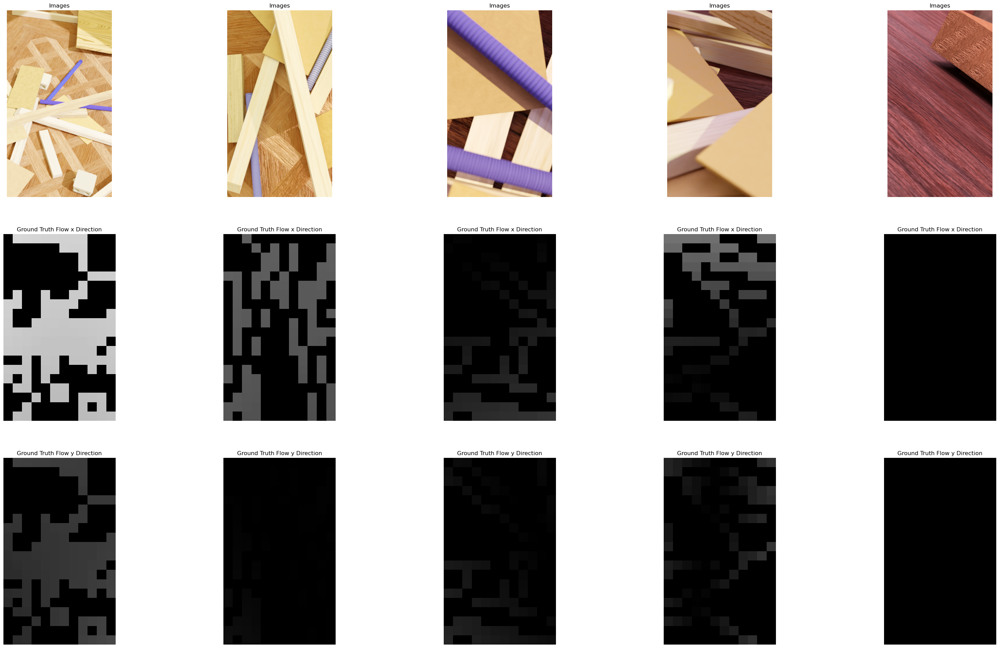

In [3]:
if Model.train_model:
    train_ds, img_count_train = DataProcessing.load_dataset(DataProcessing.key.train)
test_ds, img_count_test = DataProcessing.load_dataset(DataProcessing.key.test)

if Model.train_model:
    for inp, out in test_ds.take(1):
        edge_detection_plots.plot_flow_field(images=inp['in_img'], 
                                             flow_ground_truth=out['out_flow'], 
                                             batch_size=DataProcessing.cfg['TEST']['BATCH_SIZE'])
        #edge_detection_plots.plot_edges(images=inp['in_img'],
        #                                prior = inp['in_edge'],
        #                                batch_size=DataProcessing.cfg['TEST']['BATCH_SIZE'],
        #                                num_classes=DataProcessing.num_classes['edge'])

# Define, Compile and Train Model

In [4]:
if Model.train_model:
    model = Model.get_neural_network_model(1)
    # model.summary()

    lr = Model.get_lr(img_count_train, DataProcessing.cfg['TRAIN']['BATCH_SIZE'])
    model.compile(optimizer=tf.keras.optimizers.Adam(lr),
                  loss=Model.get_loss_function(),
                  metrics=Model.get_metrics(1))

    history = model.fit(train_ds, epochs=Model.cfg["EPOCHS"], validation_data=train_ds,
                        callbacks=Model.get_callbacks(), verbose=1)

model = Model.get_best_model_from_checkpoints()

Epoch 1/200


2022-12-14 16:21:23.389148: I tensorflow/stream_executor/cuda/cuda_dnn.cc:384] Loaded cuDNN version 8100
2022-12-14 16:21:24.156687: I tensorflow/stream_executor/cuda/cuda_blas.cc:1614] TensorFloat-32 will be used for the matrix multiplication. This will only be logged once.


267/267 [==============================] - 26s 61ms/step - loss: 669.8442 - out_flow_loss: 6.9933 - out_edge_loss: 662.8512 - accuracy: 0.7302 - accuracy_1: 0.7302 - f1: 0.2599 - precision: 0.1908 - recall: 0.4999 - f1_1: 0.2599 - precision_1: 0.1908 - recall_1: 0.4999 - val_loss: 367.8215 - val_out_flow_loss: 7.0741 - val_out_edge_loss: 360.7476 - val_accuracy: 0.9308 - val_accuracy_1: 0.9308 - val_f1: 0.6037 - val_precision: 0.5757 - val_recall: 0.6346 - val_f1_1: 0.6037 - val_precision_1: 0.5757 - val_recall_1: 0.6346
Epoch 2/200
267/267 [==============================] - 16s 59ms/step - loss: 268.1219 - out_flow_loss: 6.6329 - out_edge_loss: 261.4891 - accuracy: 0.9444 - accuracy_1: 0.9444 - f1: 0.6002 - precision: 0.7233 - recall: 0.5141 - f1_1: 0.6002 - precision_1: 0.7233 - recall_1: 0.5141 - val_loss: 242.4926 - val_out_flow_loss: 6.4618 - val_out_edge_loss: 236.0308 - val_accuracy: 0.9533 - val_accuracy_1: 0.9533 - val_f1: 0.7255 - val_precision: 0.7094 - val_recall: 0.7424 - 

267/267 [==============================] - 17s 62ms/step - loss: 145.1932 - out_flow_loss: 4.1361 - out_edge_loss: 141.0570 - accuracy: 0.9722 - accuracy_1: 0.9722 - f1: 0.8223 - precision: 0.8495 - recall: 0.7968 - f1_1: 0.8223 - precision_1: 0.8495 - recall_1: 0.7968 - val_loss: 137.5172 - val_out_flow_loss: 3.0888 - val_out_edge_loss: 134.4285 - val_accuracy: 0.9726 - val_accuracy_1: 0.9726 - val_f1: 0.8305 - val_precision: 0.8548 - val_recall: 0.8076 - val_f1_1: 0.8305 - val_precision_1: 0.8548 - val_recall_1: 0.8076
Epoch 17/200
267/267 [==============================] - 16s 61ms/step - loss: 144.4501 - out_flow_loss: 3.9771 - out_edge_loss: 140.4731 - accuracy: 0.9724 - accuracy_1: 0.9724 - f1: 0.8281 - precision: 0.8552 - recall: 0.8027 - f1_1: 0.8281 - precision_1: 0.8552 - recall_1: 0.8027 - val_loss: 136.8773 - val_out_flow_loss: 3.3454 - val_out_edge_loss: 133.5318 - val_accuracy: 0.9727 - val_accuracy_1: 0.9727 - val_f1: 0.8337 - val_precision: 0.8454 - val_recall: 0.8224 -

267/267 [==============================] - 16s 61ms/step - loss: 132.0881 - out_flow_loss: 2.7793 - out_edge_loss: 129.3088 - accuracy: 0.9751 - accuracy_1: 0.9751 - f1: 0.8418 - precision: 0.8648 - recall: 0.8200 - f1_1: 0.8418 - precision_1: 0.8648 - recall_1: 0.8200 - val_loss: 127.6568 - val_out_flow_loss: 2.2531 - val_out_edge_loss: 125.4037 - val_accuracy: 0.9744 - val_accuracy_1: 0.9744 - val_f1: 0.8451 - val_precision: 0.8506 - val_recall: 0.8397 - val_f1_1: 0.8451 - val_precision_1: 0.8506 - val_recall_1: 0.8397
Epoch 32/200
267/267 [==============================] - 16s 61ms/step - loss: 132.2545 - out_flow_loss: 2.7018 - out_edge_loss: 129.5527 - accuracy: 0.9742 - accuracy_1: 0.9742 - f1: 0.8366 - precision: 0.8580 - recall: 0.8164 - f1_1: 0.8366 - precision_1: 0.8580 - recall_1: 0.8164 - val_loss: 131.2202 - val_out_flow_loss: 2.1164 - val_out_edge_loss: 129.1037 - val_accuracy: 0.9737 - val_accuracy_1: 0.9737 - val_f1: 0.8447 - val_precision: 0.8280 - val_recall: 0.8622 -

267/267 [==============================] - 17s 63ms/step - loss: 126.6417 - out_flow_loss: 2.2877 - out_edge_loss: 124.3540 - accuracy: 0.9766 - accuracy_1: 0.9766 - f1: 0.8484 - precision: 0.8712 - recall: 0.8269 - f1_1: 0.8484 - precision_1: 0.8712 - recall_1: 0.8269 - val_loss: 125.1189 - val_out_flow_loss: 1.7620 - val_out_edge_loss: 123.3570 - val_accuracy: 0.9753 - val_accuracy_1: 0.9753 - val_f1: 0.8480 - val_precision: 0.8663 - val_recall: 0.8304 - val_f1_1: 0.8480 - val_precision_1: 0.8663 - val_recall_1: 0.8304
Epoch 47/200
267/267 [==============================] - 17s 63ms/step - loss: 127.3250 - out_flow_loss: 2.2282 - out_edge_loss: 125.0968 - accuracy: 0.9744 - accuracy_1: 0.9744 - f1: 0.8491 - precision: 0.8716 - recall: 0.8276 - f1_1: 0.8491 - precision_1: 0.8716 - recall_1: 0.8276 - val_loss: 122.9441 - val_out_flow_loss: 1.5059 - val_out_edge_loss: 121.4381 - val_accuracy: 0.9755 - val_accuracy_1: 0.9755 - val_f1: 0.8488 - val_precision: 0.8726 - val_recall: 0.8263 -

267/267 [==============================] - 17s 62ms/step - loss: 124.1498 - out_flow_loss: 1.8861 - out_edge_loss: 122.2637 - accuracy: 0.9748 - accuracy_1: 0.9748 - f1: 0.8482 - precision: 0.8705 - recall: 0.8270 - f1_1: 0.8482 - precision_1: 0.8705 - recall_1: 0.8270 - val_loss: 120.2525 - val_out_flow_loss: 1.3963 - val_out_edge_loss: 118.8561 - val_accuracy: 0.9760 - val_accuracy_1: 0.9760 - val_f1: 0.8528 - val_precision: 0.8691 - val_recall: 0.8370 - val_f1_1: 0.8528 - val_precision_1: 0.8691 - val_recall_1: 0.8370
Epoch 62/200
267/267 [==============================] - 17s 65ms/step - loss: 124.0529 - out_flow_loss: 1.7337 - out_edge_loss: 122.3192 - accuracy: 0.9762 - accuracy_1: 0.9762 - f1: 0.8525 - precision: 0.8715 - recall: 0.8343 - f1_1: 0.8525 - precision_1: 0.8715 - recall_1: 0.8343 - val_loss: 119.5958 - val_out_flow_loss: 1.2582 - val_out_edge_loss: 118.3376 - val_accuracy: 0.9761 - val_accuracy_1: 0.9761 - val_f1: 0.8543 - val_precision: 0.8656 - val_recall: 0.8433 -

267/267 [==============================] - 17s 62ms/step - loss: 121.8293 - out_flow_loss: 1.5300 - out_edge_loss: 120.2992 - accuracy: 0.9762 - accuracy_1: 0.9762 - f1: 0.8532 - precision: 0.8752 - recall: 0.8323 - f1_1: 0.8532 - precision_1: 0.8752 - recall_1: 0.8323 - val_loss: 118.9930 - val_out_flow_loss: 1.1327 - val_out_edge_loss: 117.8603 - val_accuracy: 0.9761 - val_accuracy_1: 0.9761 - val_f1: 0.8560 - val_precision: 0.8585 - val_recall: 0.8535 - val_f1_1: 0.8560 - val_precision_1: 0.8585 - val_recall_1: 0.8535
Epoch 77/200
267/267 [==============================] - 16s 61ms/step - loss: 122.0839 - out_flow_loss: 1.4899 - out_edge_loss: 120.5940 - accuracy: 0.9760 - accuracy_1: 0.9760 - f1: 0.8515 - precision: 0.8697 - recall: 0.8341 - f1_1: 0.8515 - precision_1: 0.8697 - recall_1: 0.8341 - val_loss: 117.9363 - val_out_flow_loss: 1.0833 - val_out_edge_loss: 116.8529 - val_accuracy: 0.9764 - val_accuracy_1: 0.9764 - val_f1: 0.8546 - val_precision: 0.8748 - val_recall: 0.8353 -

KeyboardInterrupt: 

1/1 [==============================] - 0s 31ms/step


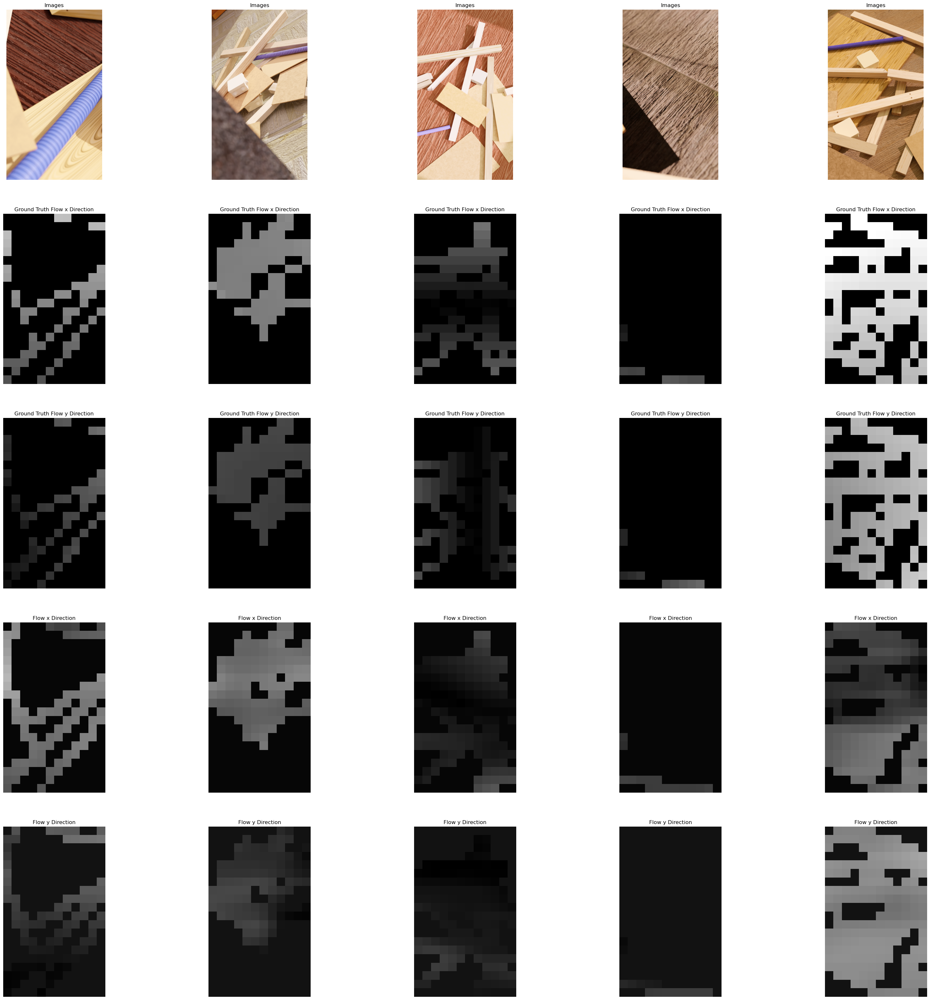

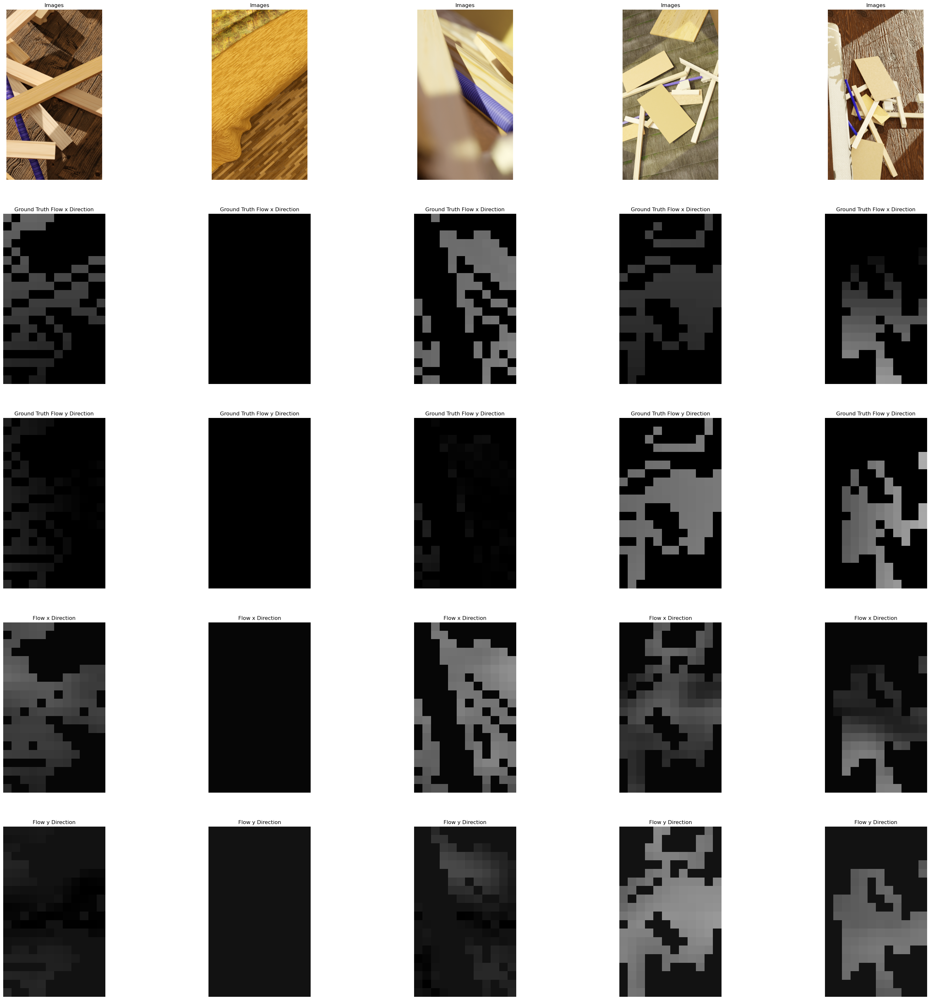

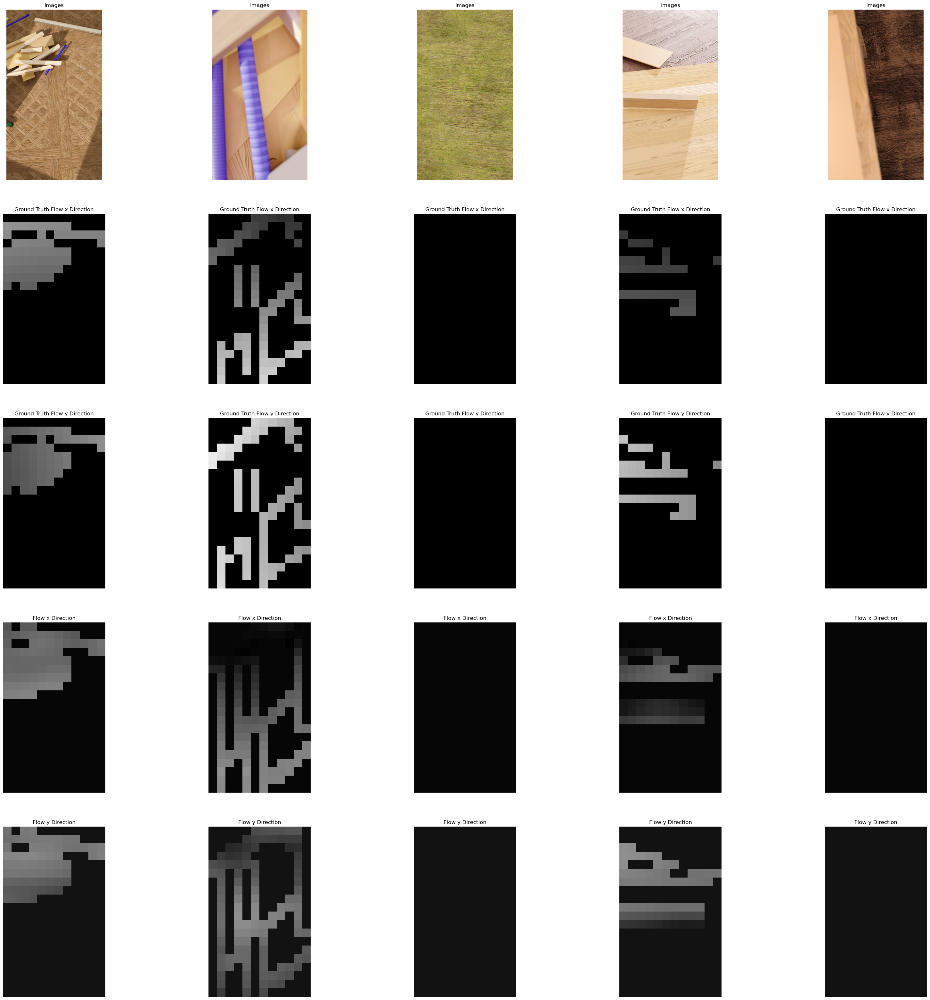

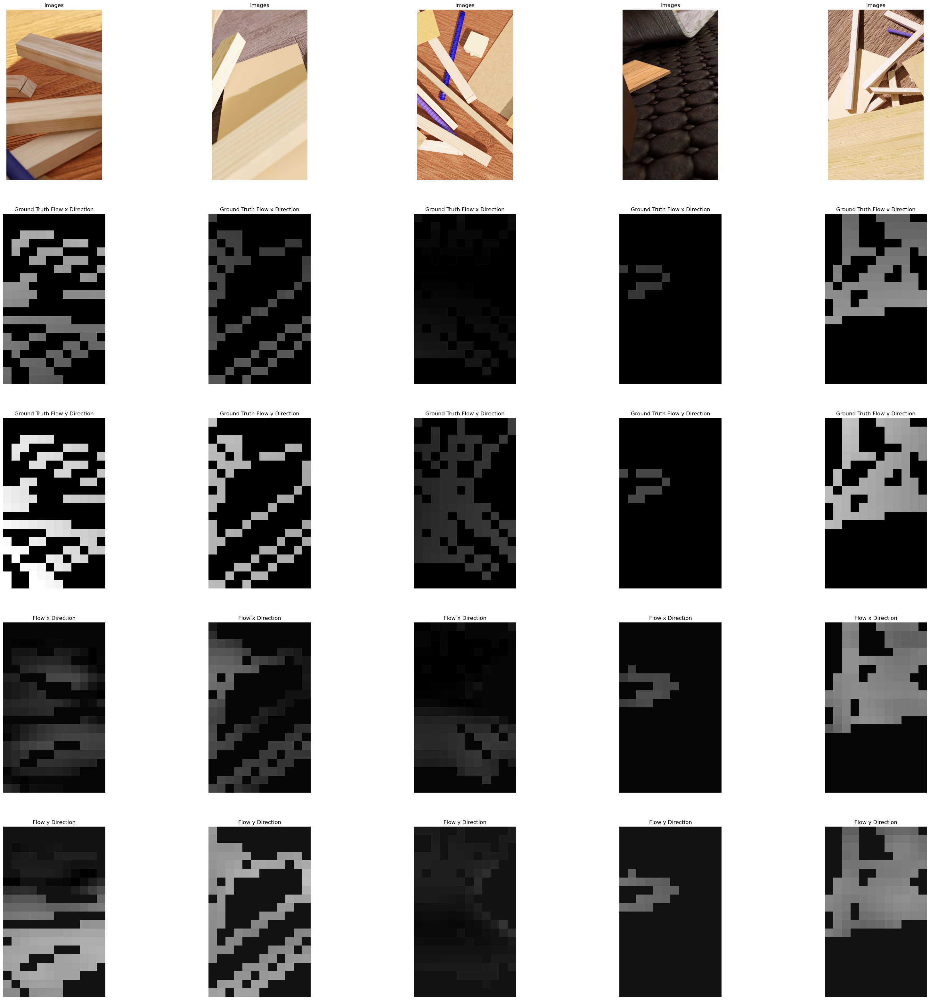

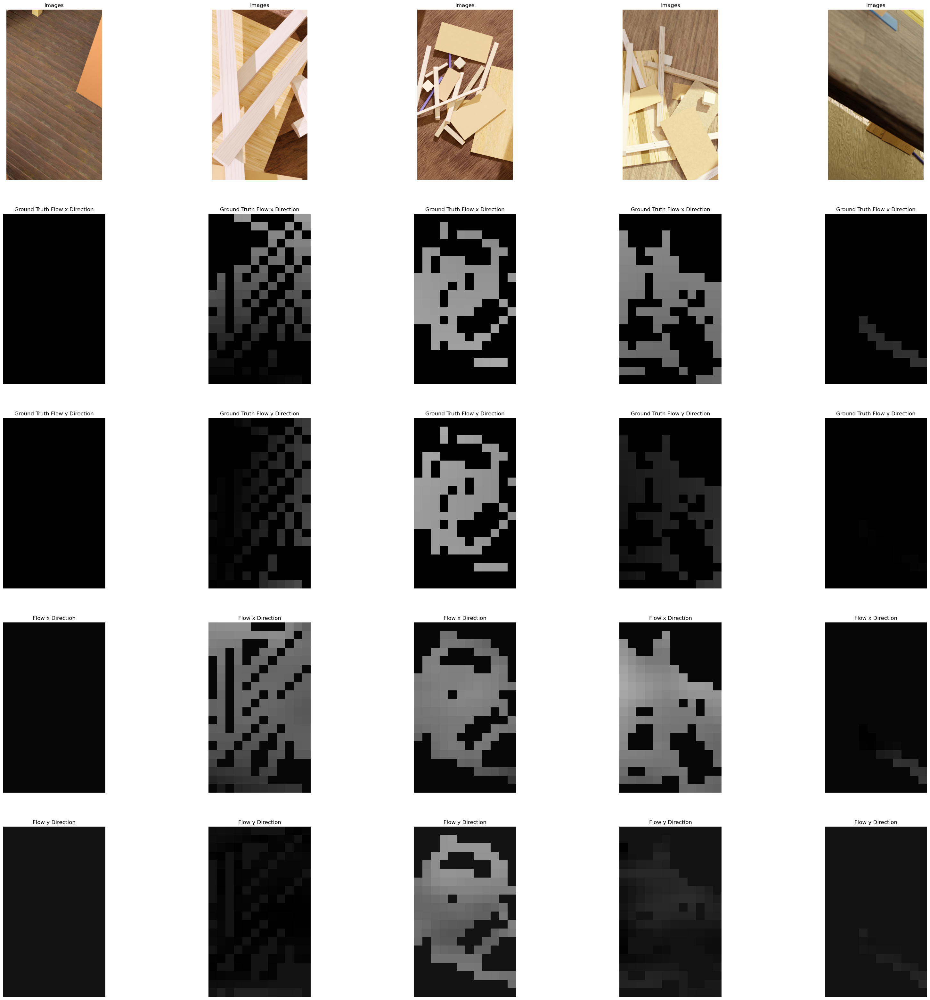

In [5]:
for inp, out in train_ds.take(5):
    pred = model.predict(inp)
    edge_detection_plots.plot_flow_field(images=inp['in_img'], 
                                         flow_ground_truth=out['out_flow'],
                                         flow_prediction=pred[0],
                                         batch_size=DataProcessing.cfg['TEST']['BATCH_SIZE'])

In [6]:
model.summary()


tf.keras.utils.plot_model(
    model,
    to_file=Model.Data.paths['FIGURES']+"/model.png",
    show_shapes=True,
    show_dtype=False,
    show_layer_names=True,
    rankdir='TB',
    expand_nested=False,
    dpi=96,
    layer_range=None,
    show_layer_activations=True
)

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 in_img (InputLayer)            [(None, 640, 360, 3  0           []                               
                                )]                                                                
                                                                                                  
 base_model (Functional)        [(None, 320, 180, 8  4096        ['in_img[0][0]']                 
                                ),                                                                
                                 (None, 160, 90, 8)                                               
                                ]                                                                 
                                                                                              

 tf.compat.v1.nn.conv2d_9 (TFOp  (None, 160, 90, 1)  0           ['tf.compat.v1.nn.conv2d_2[0][0]'
 Lambda)                                                         ]                                
                                                                                                  
 tf.compat.v1.nn.conv2d_10 (TFO  (None, 160, 90, 1)  0           ['tf.compat.v1.nn.conv2d_2[0][0]'
 pLambda)                                                        ]                                
                                                                                                  
 tf.compat.v1.nn.conv2d_12 (TFO  (None, 160, 90, 1)  0           ['tf.compat.v1.nn.conv2d_11[0][0]
 pLambda)                                                        ']                               
                                                                                                  
 tf.compat.v1.nn.conv2d_13 (TFO  (None, 160, 90, 1)  0           ['tf.compat.v1.nn.conv2d_11[0][0]
 pLambda) 

                                                                 ',                               
                                                                  'tf.compat.v1.nn.conv2d_12[0][0]
                                                                 ',                               
                                                                  'tf.compat.v1.nn.conv2d_13[0][0]
                                                                 ',                               
                                                                  'tf.compat.v1.nn.conv2d_14[0][0]
                                                                 ',                               
                                                                  'tf.compat.v1.nn.conv2d_15[0][0]
                                                                 ',                               
                                                                  'tf.compat.v1.nn.conv2d_16[0][0]
          

 flow_1_bn (BatchNormalization)  (None, 75, 40, 41)  164         ['flow_1_separable_conv[0][0]']  
                                                                                                  
 max_pooling2d_2 (MaxPooling2D)  (None, 2, 1, 41)    0           ['flow_avg_1_relu[0][0]']        
                                                                                                  
 flow_1_relu (ReLU)             (None, 75, 40, 41)   0           ['flow_1_bn[0][0]']              
                                                                                                  
 flow_avg_2_conv (Conv2D)       (None, 2, 1, 41)     1722        ['max_pooling2d_2[0][0]']        
                                                                                                  
 flow_2_separable_conv (Separab  (None, 37, 19, 41)  2091        ['flow_1_relu[0][0]']            
 leConv2D)                                                                                        
          

                                                                                                  
 concatenate_2 (Concatenate)    (None, 22, 14, 12)   0           ['tf.image.resize_2[0][0]',      
                                                                  'tf.image.resize_1[0][0]']      
                                                                                                  
 tf.where (TFOpLambda)          (None, 160, 90, 1)   0           ['tf.math.greater[0][0]']        
                                                                                                  
 image_out_2_separable_conv (Se  (None, 160, 90, 6)  223         ['concatenate[0][0]']            
 parableConv2D)                                                                                   
                                                                                                  
 flow_out_1_separable_conv (Sep  (None, 20, 12, 6)   186         ['concatenate_2[0][0]']          
 arableCon

# Plot Results

In [ ]:
if Model.train_model:
    plot_losses = ["loss", "loss"]
    plot_metrics = ["accuracy", "f1", "recall", "precision"]

    path = os.path.join(Model.Data.paths["FIGURES"], "training.svg")

    plots.plot_training_history(history=history.history, list_of_loss_names=plot_losses,
                                list_of_metric_names=plot_metrics,
                                save=Model.cfg["SAVE"], path=path)

In [ ]:
for inp, out in test_ds.take(1):
    pred = model.predict(inp)
    edge_detection_plots.plot_edges(images=inp['in_img'],
                                    prior = inp['in_edge'],
                                    labels=out['out_edge'],
                                    predictions=pred,
                                    batch_size=DataProcessing.cfg['TEST']['BATCH_SIZE'],
                                    num_classes=DataProcessing.num_classes['edge'])

In [ ]:
### Maximum F1 Score:
path_metrics_evaluation_plot = os.path.join(Model.Data.paths["FIGURES"],
                                            "threshold_metrics_evaluation_test_ds.svg")

edge_detection_plots.plot_threshold_metrics_evaluation(model=model, ds=test_ds,
                                                       num_classes=DataProcessing.num_classes['edge'],
                                                       classes_displayed_individually=True,
                                                       save=Model.cfg["SAVE"],
                                                       path=path_metrics_evaluation_plot,
                                                       accuracy_y_lim_min=0.8)


In [ ]:
if Model.cfg["CONVERT_TO_TFLITE"]:
    Model.convert_model_to_tflite(model)